# Experiment Summary (14.08 14:00)

- *Normalization*: Z-score normalization performed per bin
- *Devices*: 18
- *Workers*: 12
- *Participants*: 24 (each participant is assigned to 2 workers with RR policy)
- *Epochs*: 9 epochs for each source
- *Input Vector*: 70 x 1
- *CNN Layers*: 3 layers with 64 filters in the first two layers and 32 filters in the last layer
- *Max Pooling*: Applied twice with a size of 2 x 1
- *Kernel Size*: 5 x 1 x 1
- *Flatten*: Applied after CNN layers before the fully connected layers
- *Fully Connected Layers*: 256, 128, 64, 32, 16, 9
- *Activation Function (before the last layer)*: Tanh
- *Last Layer Type*: Probabilistic with softmax function
- *Loss Method*: Cross-Entropy (CE)
- *Learning Rate*: 0.00001
- *Regularization*: L2 applied
- *Optimizer*: SGD

*Training Phases*:
- *Phases 1-2*: Participants 1-6
- *Phases 3-4*: Participants 7-12
- *Phases 5-6*: Participants 13-18
- *Phases 7-8*: Participants 19-24

*Prediction Phases*: 
- *Phase 1*: Participants 1-6
- *Phase 2*: Participants 7-12
- *Phase 3*: Participants 13-18
- *Phase 4*: Participants 19-24


In [1]:
import set_jupyter_env
from apiServer import *
import pandas as pd 

In [2]:
API = ApiServer()

# Experiment Initialization

In [3]:
API.showJsons()


Distributed Configuration Files
--------------------

0.	dc_10w_14d_8r_3s_10c_synt.json
1.	dc_12w_12c_13d_4s_4r_tiles_rr.json
2.	dc_5d_4c_4s_4r_12w.json
3.	dc_AEC_1d_2c_1s_4r_4w.json
4.	dc_EEG_18d_12c_6s_10r_12w_CE.json
5.	dc_EEG_18d_12c_6s_10r_12w_MSE.json
6.	dc_EEG_18d_9c_3s_5r_9w_RR.json
7.	dc_EEG_1d_1c_3s_2r_3w_RR.json
8.	dc_EEG_1d_2c_1s_4r_2w.json
9.	dc_EEG_1d_2c_1s_4r_4w.json
10.	dc_EEG_3d_1c_1s_1r_1w.json
11.	dc_EEG_4d_3c_3s_2r_3w.json
12.	dc_EEG_8d_1c_3s_2r_3w_RR.json
13.	dc_EEG_8d_3c_3s_2r_3w.json
14.	dc_EEG_8d_3c_3s_2r_3w_RR.json
15.	dc_EEG_8d_3c_3s_2r_3w_demo_RR.json
16.	dc_EEG_8d_3c_3s_5r_3w_RR.json
17.	dc_EEG_8d_8c_3s_5r_8w_RR.json
18.	dc_FedTorchTest_5d_2s_2r_4c_4w.json
19.	dc_dist_14d.json
20.	dc_dist_2d_3c_2s_3r_6w.json
21.	dc_fed_dist_14d.json
22.	dc_fed_dist_2d_3c_2s_3r_6w.json
23.	dc_fed_synt_1d_2c_2r_1s_4w_1ws.json
24.	dc_mnist_13d_12w_4r_3s_3tokens.json
25.	dc_mnist_4w_5d_4r_4s_rr.json
26.	dc_synt_8d_8w_2c_4s_4r.json
27.	dc_synt_8d_8w_4c_6r_4s.json
28.	dc_synt_dis

In [4]:
dc = 4
conn = 31
exp = 23
API.setJsons(dc , conn , exp)

In [5]:
dc_path , conn_path , exp_path = API.getUserJsons()

In [6]:
exp_name = "EEG_Emotion_18Devices_24Persons_RR"
API.initialization(exp_name, dc_path, conn_path, exp_path)

[INFO][2024-08-14 11:03:17,026] 
Network components:
                 Receiver's Address: http://10.0.0.30:8931
                 Frequency: 5 [batches/sec]
                 Batchsize: 10 [samples]
                 devicesIp: ['10.0.0.30', '10.0.0.8', '10.0.0.12', '10.0.0.10', '10.0.0.32', '10.0.0.33', '10.0.0.34', '10.0.0.35', '10.0.0.47', '10.0.0.48', '10.0.0.49', '10.0.0.50', '10.0.0.51', '10.0.0.52', '10.0.0.53', '10.0.0.54', '10.0.0.55', '10.0.0.56']
                 mainServerIp: 10.0.0.30
                 mainServerPort: 8900
                 apiServerIp: 10.0.0.30
                 apiServerPort: 8931
                 Clients: ['c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9', 'c10', 'c11', 'c12']
                 Workers: ['w1', 'w2', 'w3', 'w4', 'w5', 'w6', 'w7', 'w8', 'w9', 'w10', 'w11', 'w12']
                 Sources: ['s1', 's2', 's3', 's4', 's5', 's6']
                 Routers: ['r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9', 'rms']
[INFO][2024-08-14 11:03:17,027

 * Serving Flask app 'receiver'
 * Debug mode: off


[INFO][2024-08-14 11:03:19,379] *** Remember to execute NerlnetRun.sh on each device before running the experiment! ***


# Connection Map:

Note: you may need to restart the kernel to use updated packages.
Connections:  [('rms', ['mainServer', 'r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9']), ('r1', ['c1', 'c2', 'r2']), ('r2', ['c3', 'c4', 'r3']), ('r3', ['c5', 'c6', 'r4']), ('r4', ['c7', 'c8', 'r5']), ('r5', ['c9', 'c10', 'r6']), ('r6', ['c11', 'c12', 'r7']), ('r7', ['s1', 's2', 'r8', 'r4', 'r2', 'r5', 'r3', 'r1']), ('r8', ['s3', 's4', 'r9', 'r3', 'r4', 'r1', 'r2']), ('r9', ['s5', 's6', 'r3', 'r5', 'r1', 'r6', 'r2', 'r4'])]
Routers:  ['rms', 'r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9']
Workers:  ['w1', 'w2', 'w3', 'w4', 'w5', 'w6', 'w7', 'w8', 'w9', 'w10', 'w11', 'w12']
Adding edge (rms , mainServer) to graph
Adding edge (rms , r1) to graph
Adding edge (rms , r2) to graph
Adding edge (rms , r3) to graph
Adding edge (rms , r4) to graph
Adding edge (rms , r5) to graph
Adding edge (rms , r6) to graph
Adding edge (rms , r7) to graph
Adding edge (rms , r8) to graph
Adding edge (rms , r9) to graph
Adding edge (r1

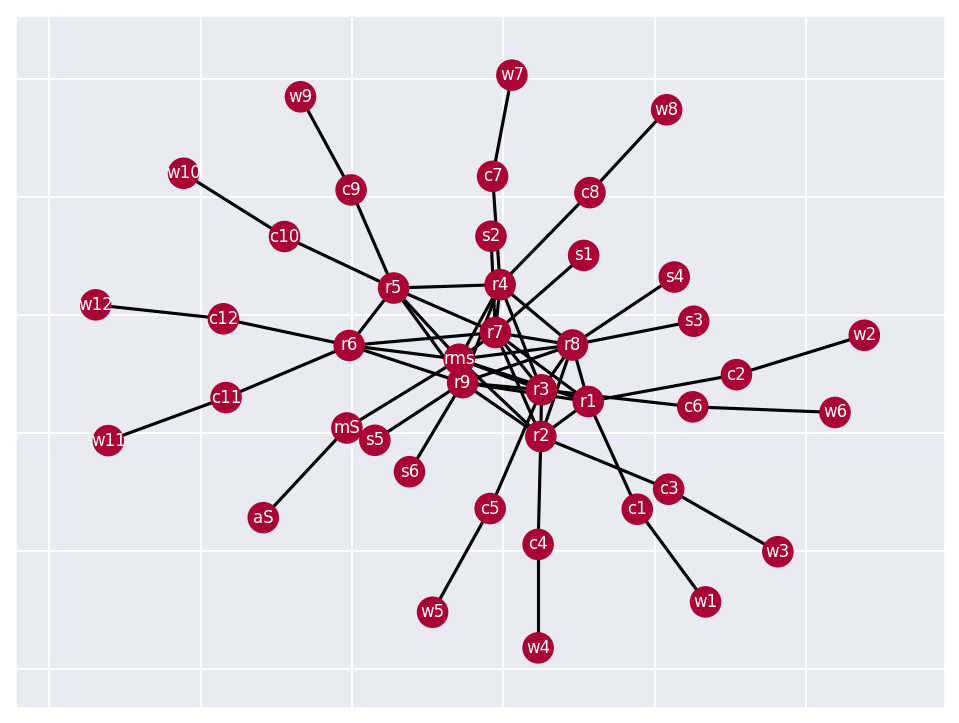

In [7]:
%pip install networkx pygraphviz
import networkx as nx
def visualize_nerlnet_graph(api_server_inst,  connections : dict , components): # connections is a dictionary with keys as routers and values as lists of their neighbors
    print("Connections: " , list(connections.items()))
    routers = list(connections.keys())
    print("Routers: " , routers)
    workers = list(components.map_worker_to_client.keys())
    print("Workers: " , workers)
    graph = nx.Graph()
    nodes = routers + components.sources + components.clients + workers + [API_SERVER_STR , MAIN_SERVER_STR]
    edges = [] # list of tuples
    for router , neighbors in list(connections.items()):
        for neighbor in neighbors:
            if (router,neighbor) not in edges:
                print(f"Adding edge ({router} , {neighbor}) to graph")
                edges.append((router , neighbor))
    edges.append((API_SERVER_STR , MAIN_SERVER_STR)) # Always connected
    for worker in workers:
        edges.append((worker , components.map_worker_to_client[worker]))
    graph.add_nodes_from(nodes)
    graph.add_edges_from(edges)
    
    my_labels = {'mainServer': 'mS' , 'apiServer': 'aS'}
    nx.relabel_nodes(graph, my_labels , copy=False)
    
    default_colors = {node:'#A90433' for node in graph.nodes()}
    node_colors = {node:default_colors[node] for node in graph.nodes()}
    nx.set_node_attributes(graph, node_colors, 'color')
    colors = nx.get_node_attributes(graph, 'color').values()

    pos = nx.nx_agraph.graphviz_layout(graph)
    angle = 100
    
    plt.figure(figsize=(8,6),dpi=150)
    nx.draw_networkx(graph, pos, with_labels=True, node_color=colors , node_size=200, font_size=8, font_color='white' , edge_color='black' , width=1.5)
    plt.show()
visualize_nerlnet_graph(API , API.json_dir_parser.json_from_path(conn_path)['connectionsMap'] , globe.components)

In [8]:
API.send_jsons_to_devices()

[INFO][2024-08-14 11:03:22,782] Sending distributed configurations to devices is completed


## Training phase 1:

In [9]:
API.run_current_experiment_phase()

[INFO][2024-08-14 11:03:22,788] Experiment phase: training_phase1 of type training starts running...
[INFO][2024-08-14 11:03:22,788] Sending data to sources
[INFO][2024-08-14 11:03:45,305] Data is ready in sources
[INFO][2024-08-14 11:03:45,306] Phase training requested from Main Server
[INFO][2024-08-14 11:21:44,225] Processing experiment phase data
[INFO][2024-08-14 11:21:44,683] Processing experiment phase data completed
[INFO][2024-08-14 11:21:44,684] Start generating communication statistics for training_phase1 of type training
[INFO][2024-08-14 11:21:44,685] Statistics requested from Main Server
[INFO][2024-08-14 11:21:44,738] Statistics received from Main Server
[INFO][2024-08-14 11:21:44,739] Phase of training_phase1 training completed


In [10]:
stats_train1 = API.get_experiment_flow(exp_name).generate_stats()

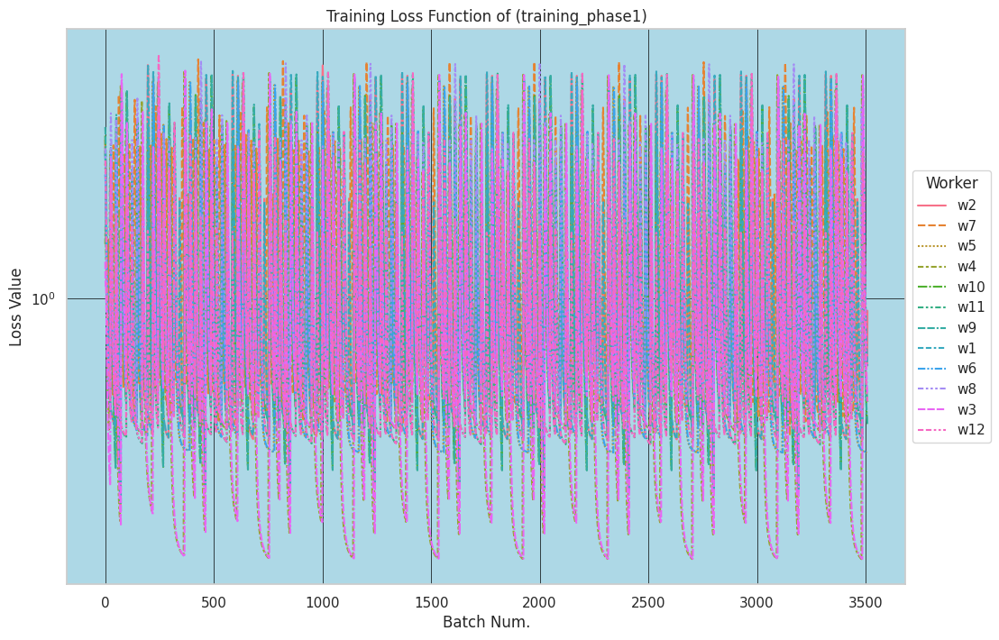

In [11]:
df_loss1 = stats_train1.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
directory = '/home/nerlnet/workspace/NErlNet/experiments_results/discretization'
os.makedirs(directory, exist_ok=True)
filename = f'train1_loss.csv'
filepath = os.path.join(directory, filename)
df_loss1.to_csv(filepath)

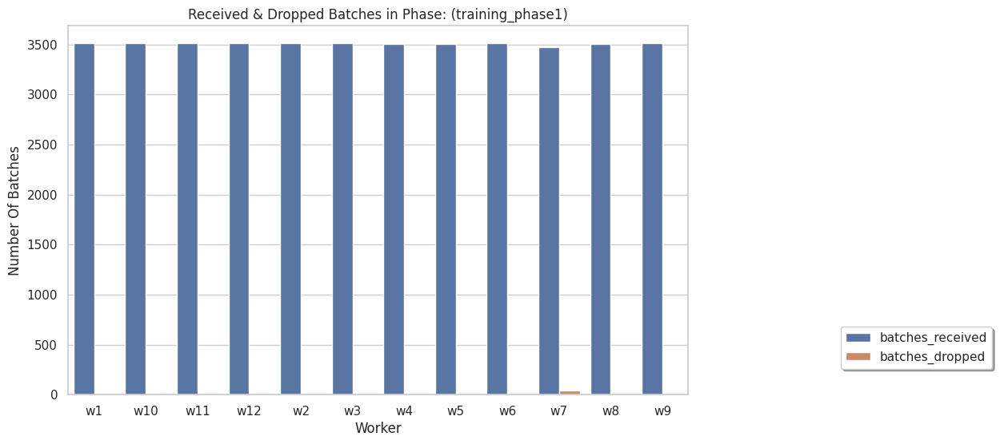

In [12]:
recieved_train = stats_train1.get_recieved_batches()
missed_train = stats_train1.get_missed_batches()
stats_train1.plot_batches_status(plot=True)

In [ ]:
folder_path = "/home/nerlnet/workspace/NErlNet/experiments_results/discretization"  
file_name = "recieved_batches_train_1.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_1.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 2:

In [13]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 11:21:48,117] Experiment phase: training_phase2 of type training starts running...
[INFO][2024-08-14 11:21:48,118] Sending data to sources
[INFO][2024-08-14 11:22:09,621] Data is ready in sources
[INFO][2024-08-14 11:22:09,623] Phase training requested from Main Server
[INFO][2024-08-14 11:40:08,250] Processing experiment phase data
[INFO][2024-08-14 11:40:08,565] Processing experiment phase data completed
[INFO][2024-08-14 11:40:08,566] Start generating communication statistics for training_phase2 of type training
[INFO][2024-08-14 11:40:08,567] Statistics requested from Main Server
[INFO][2024-08-14 11:40:08,620] Statistics received from Main Server
[INFO][2024-08-14 11:40:08,622] Phase of training_phase2 training completed


In [14]:
stats_train2 = API.get_experiment_flow(exp_name).generate_stats()

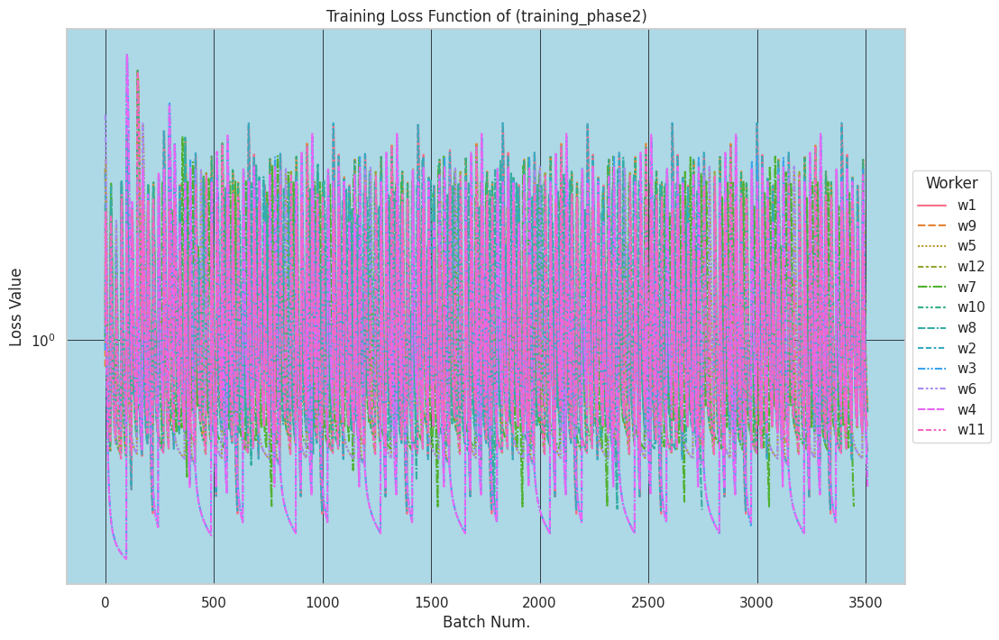

,w1,w9,w5,w12,w7,w10,w8,w2,w3,w6,w4,w11
0,3.042304,0.839455,1.261626,3.094852,1.012433,2.086187,2.438973,2.991437,0.934596,4.403472,2.188130,1.102088
1,2.833437,1.440390,2.783205,2.871612,1.704290,1.908920,2.244116,2.784338,1.540399,4.144438,1.986624,2.065930
2,2.543747,1.567146,3.287581,2.560211,1.858402,1.675383,1.984452,2.497789,1.645023,3.770791,1.720410,2.327168
3,2.239010,1.489311,3.298802,2.230993,1.776486,1.445048,1.724931,2.197280,1.535288,3.357674,1.457111,2.261142
4,1.952486,1.340230,3.081824,1.920476,1.608969,1.243563,1.494728,1.915735,1.353418,2.945532,1.226120,2.058209
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.505037,0.725962,0.517822,0.583916,NaN,0.700483,NaN,0.504184,0.482425,0.509628,0.451246,0.593256
3506,0.498101,0.697090,0.507620,0.575641,NaN,0.675865,NaN,0.497375,0.455575,0.500755,0.429475,0.583876
3507,0.492146,0.673100,0.499064,0.568383,NaN,0.655272,NaN,0.491525,0.433075,0.493262,0.411047,0.575713
3508,0.486999,0.653008,0.491826,0.561966,NaN,0.637908,NaN,0.486465,0.414059,0.486883,0.395320,0.568546


In [15]:
df_loss2 = stats_train2.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train2_loss.csv'
filepath = os.path.join(directory, filename)
df_loss2.to_csv(filepath)

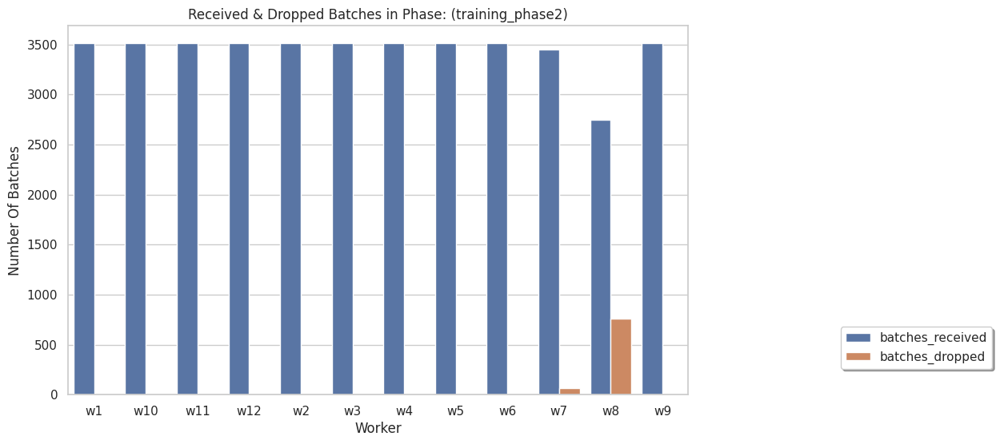

In [16]:
recieved_train = stats_train2.get_recieved_batches()
missed_train = stats_train2.get_missed_batches()
stats_train2.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_2.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_2.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 3:

In [17]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 11:40:11,965] Experiment phase: training_phase3 of type training starts running...
[INFO][2024-08-14 11:40:11,966] Sending data to sources
[INFO][2024-08-14 11:40:35,817] Data is ready in sources
[INFO][2024-08-14 11:40:35,818] Phase training requested from Main Server
[INFO][2024-08-14 11:58:34,166] Processing experiment phase data
[INFO][2024-08-14 11:58:34,480] Processing experiment phase data completed
[INFO][2024-08-14 11:58:34,481] Start generating communication statistics for training_phase3 of type training
[INFO][2024-08-14 11:58:34,482] Statistics requested from Main Server
[INFO][2024-08-14 11:58:34,535] Statistics received from Main Server
[INFO][2024-08-14 11:58:34,536] Phase of training_phase3 training completed


In [18]:
stats_train3 = API.get_experiment_flow(exp_name).generate_stats()

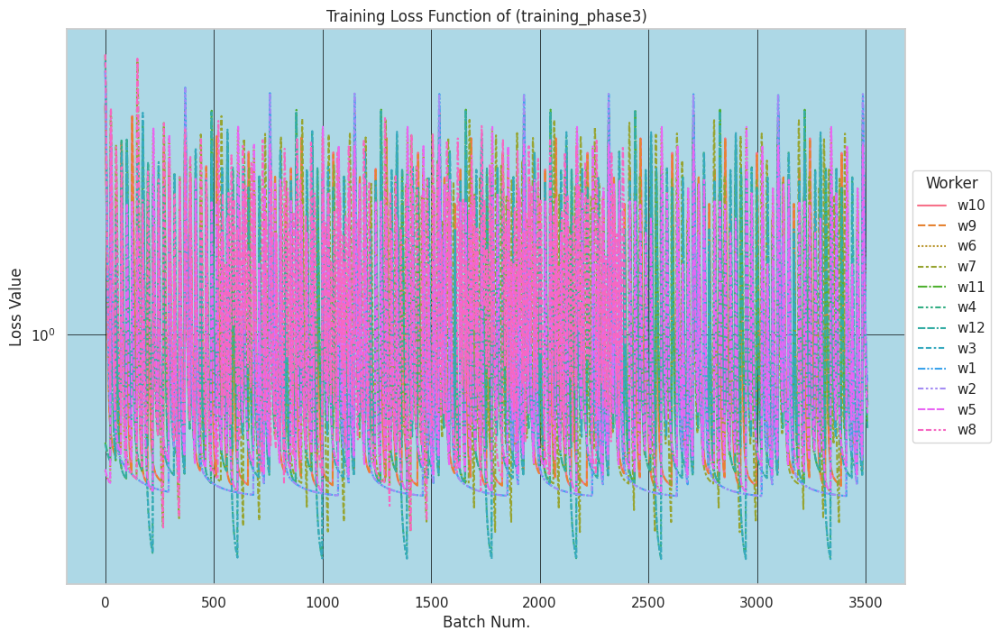

,w10,w9,w6,w7,w11,w4,w12,w3,w1,w2,w5,w8
0,3.602254,3.561257,0.471956,4.714199,0.550883,4.523868,0.545979,4.564291,4.311498,4.319015,0.475048,4.733139
1,3.387416,3.349211,0.470209,4.475630,0.548628,4.289800,0.543907,4.333272,4.073392,4.080645,0.473112,4.492805
2,3.082914,3.048794,0.467794,4.131211,0.545445,3.952982,0.540973,4.000605,3.731242,3.738077,0.470444,4.145815
3,2.752544,2.722971,0.465221,3.748217,0.541968,3.579930,0.537759,3.631582,3.353591,3.359911,0.467609,3.760011
4,2.429205,2.404175,0.462717,3.361298,0.538492,3.204760,0.534534,3.259505,2.976242,2.981983,0.464859,3.370386
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.762552,0.762532,0.703206,NaN,0.658736,0.748370,0.658243,0.749268,0.848942,0.822667,0.703824,NaN
3506,0.739185,0.739171,0.685878,NaN,0.639190,0.725913,0.638704,0.726758,0.822964,0.800971,0.686502,NaN
3507,0.719602,0.719593,0.671126,NaN,0.622758,0.707040,0.622279,0.707842,0.801245,0.782636,0.671752,NaN
3508,0.703037,0.703030,0.658448,NaN,0.608811,0.691024,0.608341,0.691790,0.782890,0.766976,0.659073,NaN


In [19]:
df_loss3 = stats_train3.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train3_loss.csv'
filepath = os.path.join(directory, filename)
df_loss3.to_csv(filepath)

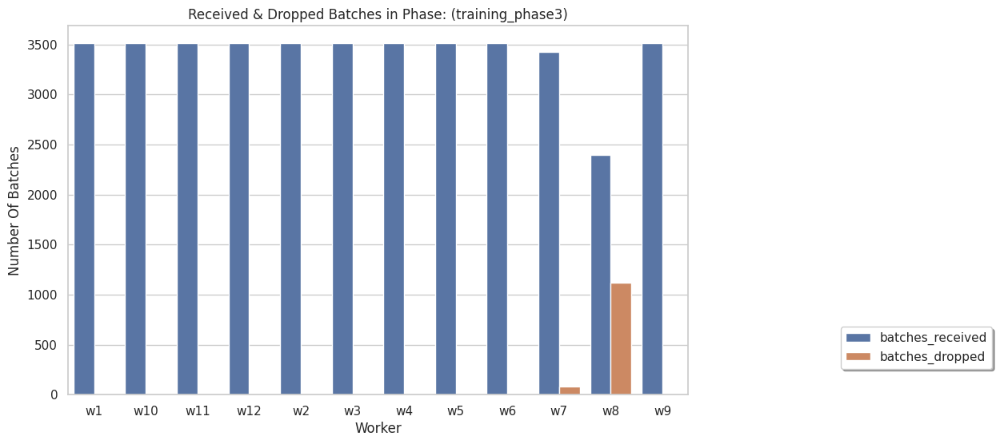

In [20]:
recieved_train = stats_train3.get_recieved_batches()
missed_train = stats_train3.get_missed_batches()
stats_train3.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_3.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_3.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 4:

In [21]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 11:58:37,824] Experiment phase: training_phase4 of type training starts running...
[INFO][2024-08-14 11:58:37,825] Sending data to sources
[INFO][2024-08-14 11:59:01,430] Data is ready in sources
[INFO][2024-08-14 11:59:01,431] Phase training requested from Main Server
[INFO][2024-08-14 12:17:00,044] Processing experiment phase data
[INFO][2024-08-14 12:17:00,358] Processing experiment phase data completed
[INFO][2024-08-14 12:17:00,359] Start generating communication statistics for training_phase4 of type training
[INFO][2024-08-14 12:17:00,359] Statistics requested from Main Server
[INFO][2024-08-14 12:17:00,412] Statistics received from Main Server
[INFO][2024-08-14 12:17:00,415] Phase of training_phase4 training completed


In [22]:
stats_train4 = API.get_experiment_flow(exp_name).generate_stats()

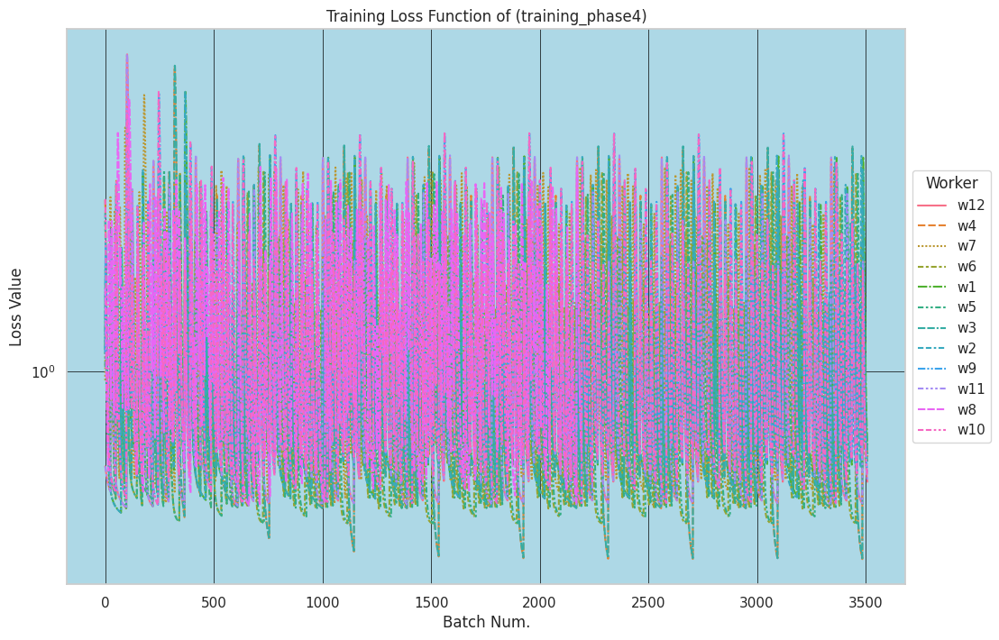

,w12,w4,w7,w6,w1,w5,w3,w2,w9,w11,w8,w10
0,0.575783,2.690770,0.946836,2.384672,1.133754,1.024023,1.104180,2.493193,1.115499,0.576229,1.615036,2.705345
1,0.571959,2.488500,1.505675,2.189064,1.789017,1.683250,1.870468,2.295582,1.884422,0.572402,1.498372,2.503936
2,0.566657,2.212739,1.614365,1.928254,1.921628,1.820236,2.053898,2.028841,2.069856,0.567094,1.346457,2.229157
3,0.560980,1.929148,1.528906,1.667460,1.823061,1.728929,1.974060,1.757934,1.991379,0.561411,1.196821,1.946261
4,0.555425,1.669545,1.375965,1.436075,1.639480,1.555969,1.791777,1.513406,1.809793,0.555849,1.064611,1.686909
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.550923,0.669061,NaN,NaN,0.739614,0.623505,0.686579,NaN,0.583527,0.557353,NaN,0.574747
3506,0.543440,0.650009,NaN,NaN,0.708855,0.611621,0.664625,NaN,0.574401,0.548849,NaN,0.566697
3507,0.537019,0.633969,NaN,NaN,0.683359,0.601414,0.646286,NaN,0.566467,0.541604,NaN,0.559643
3508,0.531459,0.620336,NaN,NaN,0.662052,0.592569,0.630815,NaN,0.559509,0.535376,NaN,0.553412


In [23]:
df_loss4 = stats_train4.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train4_loss.csv'
filepath = os.path.join(directory, filename)
df_loss4.to_csv(filepath)

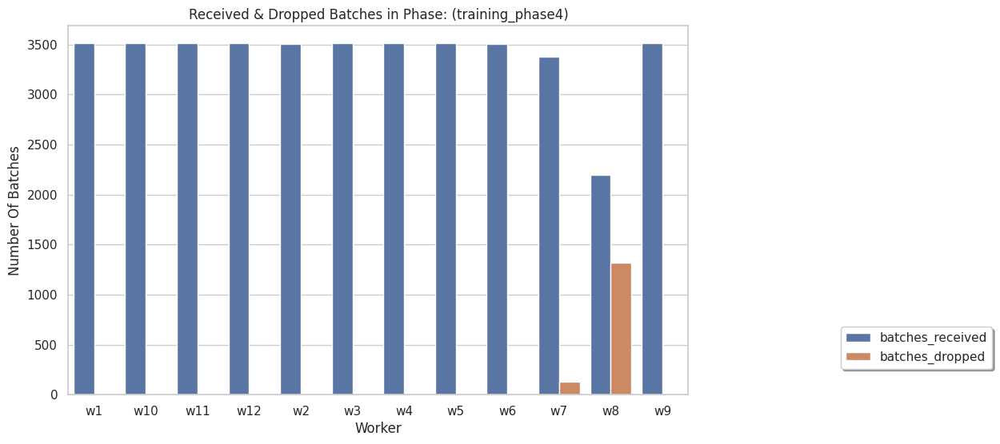

In [24]:
recieved_train = stats_train4.get_recieved_batches()
missed_train = stats_train4.get_missed_batches()
stats_train4.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_4.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_4.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 5:

In [25]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 12:17:03,894] Experiment phase: training_phase5 of type training starts running...
[INFO][2024-08-14 12:17:03,897] Sending data to sources
[INFO][2024-08-14 12:17:33,473] Data is ready in sources
[INFO][2024-08-14 12:17:33,474] Phase training requested from Main Server
[INFO][2024-08-14 12:35:32,066] Processing experiment phase data
[INFO][2024-08-14 12:35:32,378] Processing experiment phase data completed
[INFO][2024-08-14 12:35:32,379] Start generating communication statistics for training_phase5 of type training
[INFO][2024-08-14 12:35:32,380] Statistics requested from Main Server
[INFO][2024-08-14 12:35:32,433] Statistics received from Main Server
[INFO][2024-08-14 12:35:32,434] Phase of training_phase5 training completed


In [26]:
stats_train5 = API.get_experiment_flow(exp_name).generate_stats()

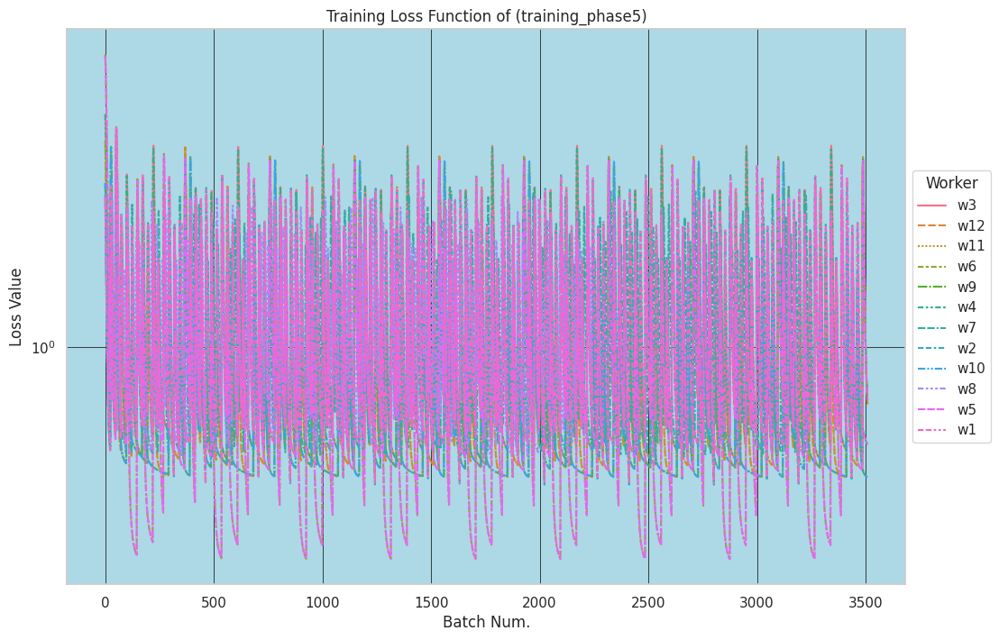

,w3,w12,w11,w6,w9,w4,w7,w2,w10,w8,w5,w1
0,4.862204,4.052009,4.034545,7.336244,3.057972,4.872969,2.682814,2.815156,3.062576,2.742238,7.255164,2.784044
1,4.633226,3.812360,3.796127,7.076075,2.841548,4.642196,2.483731,2.621323,2.845015,2.540065,6.996342,2.592920
2,4.302594,3.469072,3.454673,6.696179,2.538172,4.309031,2.211951,2.351469,2.540056,2.263257,6.618419,2.326993
3,3.934221,3.092387,3.080056,6.266347,2.215717,3.937984,1.931755,2.066038,2.216020,1.976890,6.190779,2.045839
4,3.560421,2.719639,2.709386,5.820761,1.909959,3.561706,1.674327,1.795753,1.908959,1.712822,5.747383,1.779666
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.795900,0.759170,0.759465,0.775103,0.416000,0.794681,NaN,0.522250,0.415611,NaN,0.774966,0.523861
3506,0.771009,0.733734,0.734030,0.751679,0.415624,0.769778,NaN,0.520443,0.415260,NaN,0.751489,0.521996
3507,0.750136,0.712579,0.712872,0.732034,0.415278,0.748898,NaN,0.518699,0.414936,NaN,0.731801,0.520199
3508,0.732458,0.694810,0.695100,0.715394,0.414958,0.731216,NaN,0.517012,0.414636,NaN,0.715128,0.518464


In [27]:
df_loss5 = stats_train5.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train5_loss.csv'
filepath = os.path.join(directory, filename)
df_loss5.to_csv(filepath)

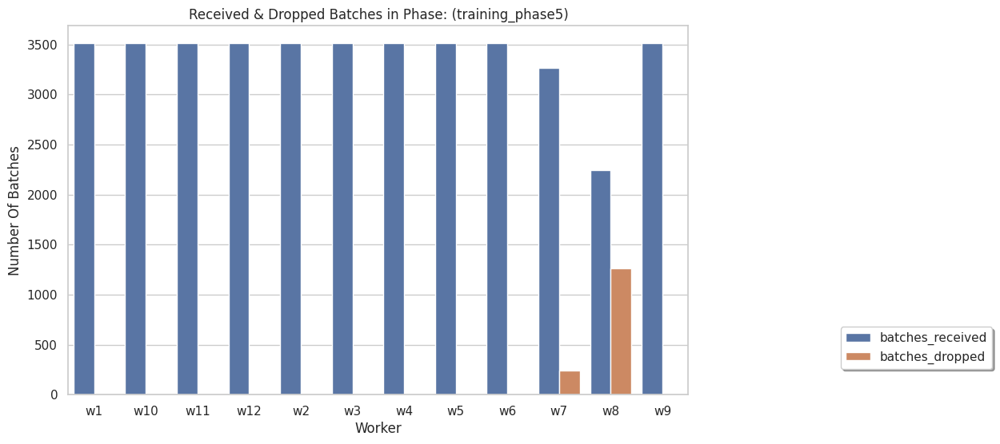

In [28]:
recieved_train = stats_train5.get_recieved_batches()
missed_train = stats_train5.get_missed_batches()
stats_train5.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_5.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_5.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 6:

In [29]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 12:35:35,857] Experiment phase: training_phase6 of type training starts running...
[INFO][2024-08-14 12:35:35,858] Sending data to sources
[INFO][2024-08-14 12:36:02,043] Data is ready in sources
[INFO][2024-08-14 12:36:02,044] Phase training requested from Main Server
[INFO][2024-08-14 12:54:00,633] Processing experiment phase data
[INFO][2024-08-14 12:54:00,976] Processing experiment phase data completed
[INFO][2024-08-14 12:54:00,977] Start generating communication statistics for training_phase6 of type training
[INFO][2024-08-14 12:54:00,978] Statistics requested from Main Server
[INFO][2024-08-14 12:54:01,031] Statistics received from Main Server
[INFO][2024-08-14 12:54:01,033] Phase of training_phase6 training completed


In [30]:
stats_train6 = API.get_experiment_flow(exp_name).generate_stats()

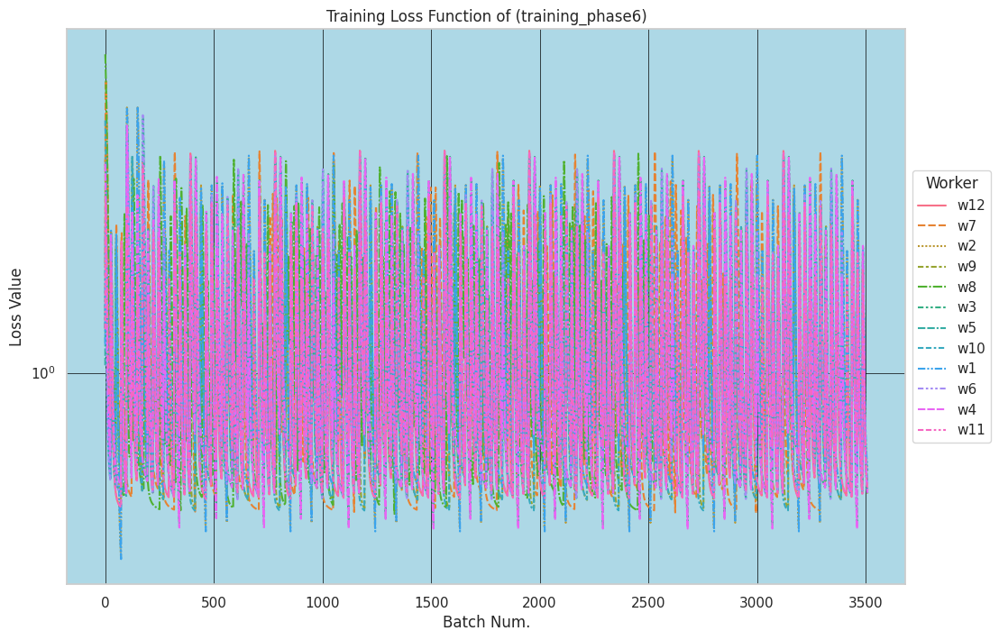

,w12,w7,w2,w9,w8,w3,w5,w10,w1,w6,w4,w11
0,3.707191,1.934726,3.680730,1.313359,7.045619,1.317475,1.046786,4.697731,1.186414,2.311234,3.598135,1.306898
1,3.487927,4.621404,3.442788,2.952926,6.818654,2.429127,1.660297,4.439880,2.384224,2.122835,3.378889,2.471536
2,3.177475,5.712320,3.102724,3.517382,6.485734,2.766760,1.781311,4.066879,2.748240,1.872560,3.068243,2.835900
3,2.841630,6.015708,2.732055,3.558498,6.106339,2.736020,1.688583,3.652310,2.712941,1.623010,2.731650,2.819138
4,2.514736,5.934998,2.369735,3.354397,5.709333,2.541305,1.520526,3.235196,2.499150,1.401928,2.403090,2.632637
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.516376,NaN,0.581211,0.511566,NaN,0.522388,0.544529,0.502445,0.592483,0.536653,0.512431,0.523953
3506,0.507588,NaN,0.569848,0.500570,NaN,0.510099,0.533951,0.492909,0.579494,0.527351,0.501759,0.513941
3507,0.500105,NaN,0.560089,0.491344,NaN,0.499829,0.524984,0.484858,0.568416,0.519411,0.492786,0.505472
3508,0.493684,NaN,0.551644,0.483547,NaN,0.491182,0.517319,0.478013,0.558891,0.512583,0.485187,0.498250


In [31]:
df_loss6 = stats_train6.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train6_loss.csv'
filepath = os.path.join(directory, filename)
df_loss6.to_csv(filepath)

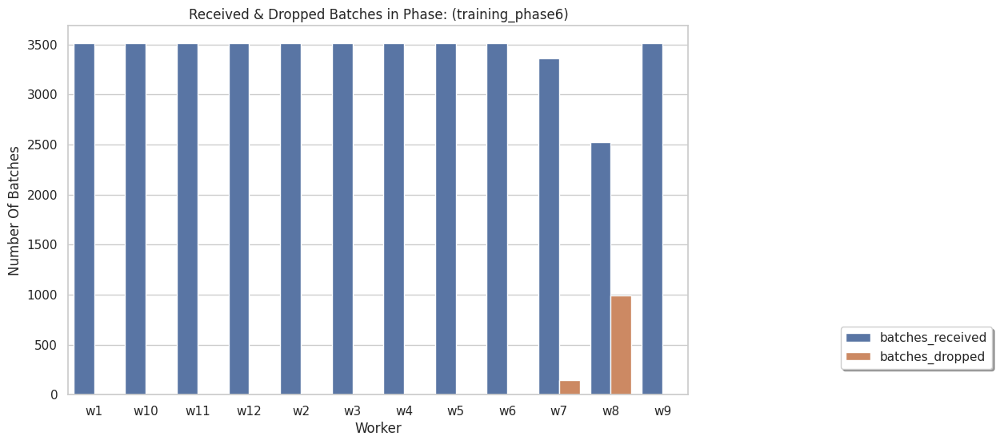

In [32]:
recieved_train = stats_train6.get_recieved_batches()
missed_train = stats_train6.get_missed_batches()
stats_train6.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_6.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_6.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 7:

In [33]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 12:54:04,302] Experiment phase: training_phase7 of type training starts running...
[INFO][2024-08-14 12:54:04,303] Sending data to sources
[INFO][2024-08-14 12:54:32,088] Data is ready in sources
[INFO][2024-08-14 12:54:32,089] Phase training requested from Main Server
[INFO][2024-08-14 13:12:30,986] Processing experiment phase data
[INFO][2024-08-14 13:12:31,299] Processing experiment phase data completed
[INFO][2024-08-14 13:12:31,300] Start generating communication statistics for training_phase7 of type training
[INFO][2024-08-14 13:12:31,301] Statistics requested from Main Server
[INFO][2024-08-14 13:12:31,354] Statistics received from Main Server
[INFO][2024-08-14 13:12:31,355] Phase of training_phase7 training completed


In [34]:
stats_train7 = API.get_experiment_flow(exp_name).generate_stats()

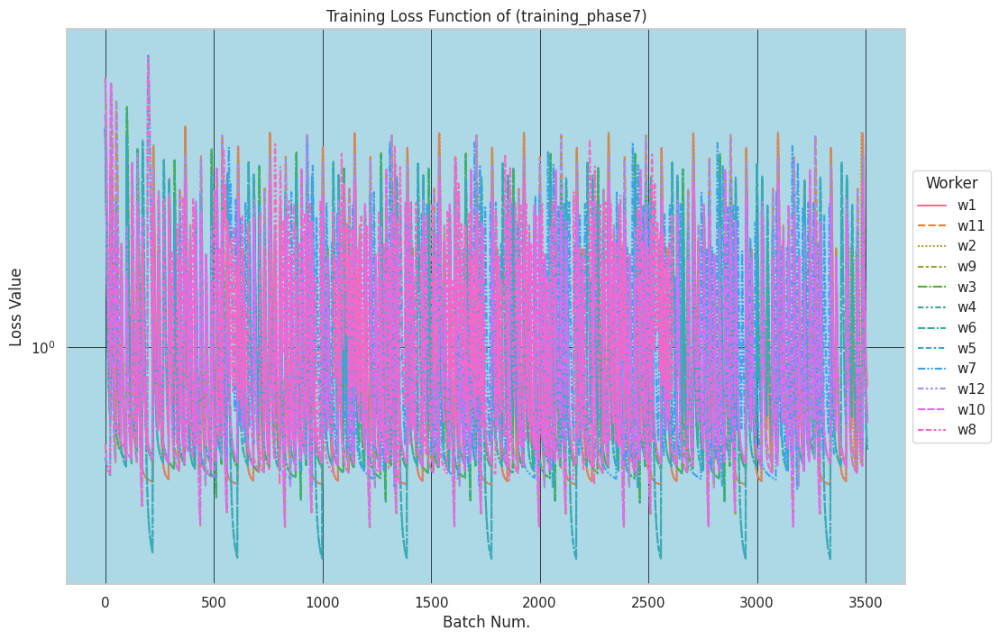

,w1,w11,w2,w9,w3,w4,w6,w5,w7,w12,w10,w8
0,3.859949,4.343772,3.880396,5.492221,3.978384,3.998958,4.014995,4.000145,0.499499,4.354725,5.504308,0.540655
1,3.631709,4.107274,3.650538,5.254154,3.749471,3.768528,3.780732,3.767181,0.496241,4.117023,5.264923,0.534350
2,3.306941,3.766966,3.323384,4.908488,3.422484,3.439312,3.445690,3.434029,0.491784,3.774988,4.917369,0.525867
3,2.953380,3.390478,2.967164,4.520471,3.064570,3.078908,3.078489,3.068898,0.487089,3.396647,4.527320,0.517090
4,2.606526,3.013022,2.617687,4.122760,2.710998,2.722850,2.715257,2.707669,0.482580,3.017446,4.127674,0.508815
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.848766,0.711332,NaN,0.673620,NaN,NaN,0.570834,0.556976,NaN,0.710654,0.673206,NaN
3506,0.823050,0.685969,NaN,0.657206,NaN,NaN,0.556167,0.544569,NaN,0.685369,0.656794,NaN
3507,0.801419,0.664755,NaN,0.643245,NaN,NaN,0.543841,0.534058,NaN,0.664222,0.642838,NaN
3508,0.783049,0.646862,NaN,0.631257,NaN,NaN,0.533399,0.525085,NaN,0.646385,0.630855,NaN


In [35]:
df_loss7 = stats_train7.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train7_loss.csv'
filepath = os.path.join(directory, filename)
df_loss7.to_csv(filepath)

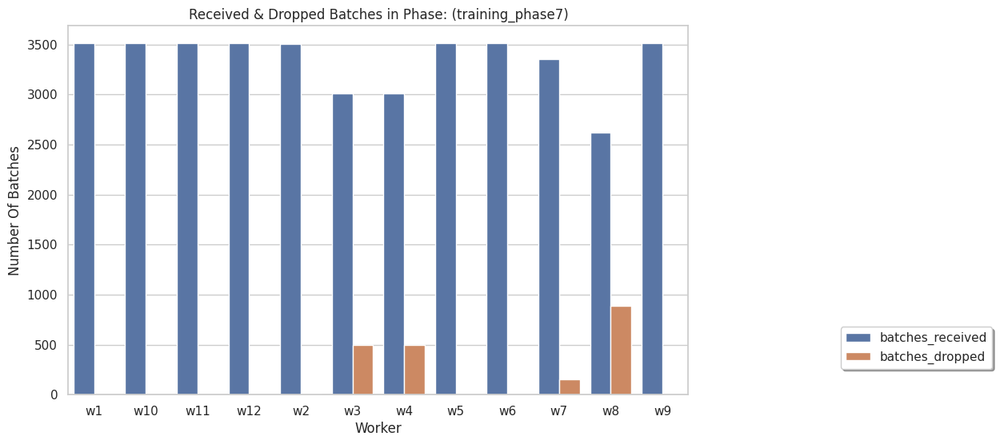

In [36]:
recieved_train = stats_train7.get_recieved_batches()
missed_train = stats_train7.get_missed_batches()
stats_train7.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_7.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_7.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

## Training phase 8:

In [37]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 13:12:34,575] Experiment phase: training_phase8 of type training starts running...
[INFO][2024-08-14 13:12:34,576] Sending data to sources
[INFO][2024-08-14 13:13:01,249] Data is ready in sources
[INFO][2024-08-14 13:13:01,250] Phase training requested from Main Server
[INFO][2024-08-14 13:31:00,247] Processing experiment phase data
[INFO][2024-08-14 13:31:00,811] Processing experiment phase data completed
[INFO][2024-08-14 13:31:00,812] Start generating communication statistics for training_phase8 of type training
[INFO][2024-08-14 13:31:00,813] Statistics requested from Main Server
[INFO][2024-08-14 13:31:00,866] Statistics received from Main Server
[INFO][2024-08-14 13:31:00,867] Phase of training_phase8 training completed


In [38]:
stats_train8 = API.get_experiment_flow(exp_name).generate_stats()

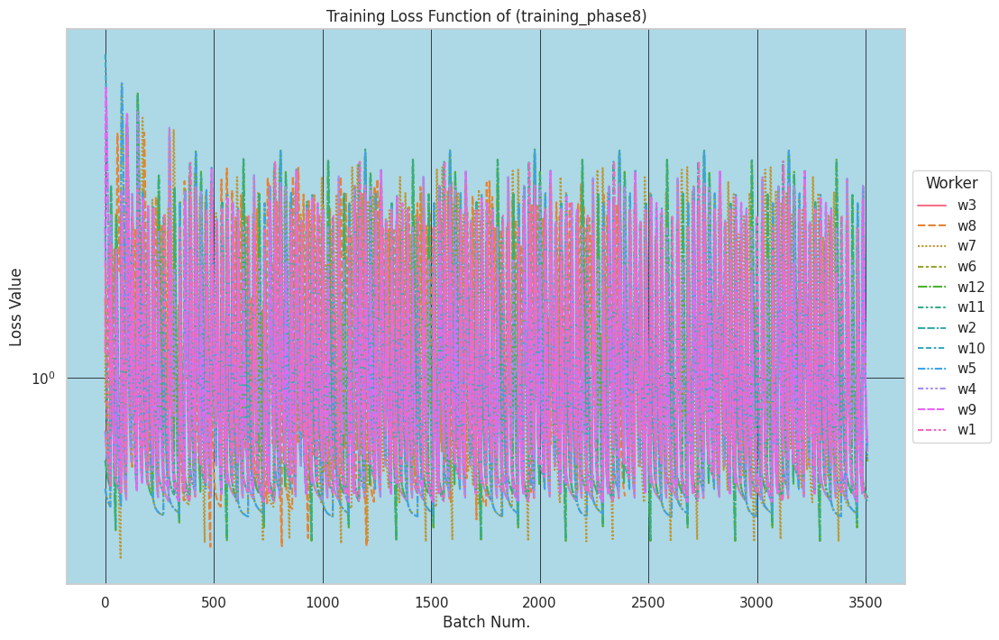

,w3,w8,w7,w6,w12,w11,w2,w10,w5,w4,w9,w1
0,0.722179,1.616959,0.860821,0.509157,0.605198,0.605547,2.498179,7.120738,0.509657,0.720545,1.949970,1.164789
1,0.709569,1.498569,1.480347,0.506355,0.600460,0.600794,2.311228,6.881516,0.506837,0.707962,4.494915,1.860626
2,0.692933,1.344938,1.615420,0.502490,0.593922,0.594237,2.057551,6.533121,0.502948,0.691360,5.528675,2.014507
3,0.676028,1.194228,1.539695,0.498381,0.586961,0.587256,1.797537,6.139972,0.498812,0.674491,5.817302,1.925036
4,0.660347,1.061656,1.388946,0.494392,0.580190,0.580466,1.559808,5.733436,0.494798,0.658843,5.743213,1.742142
...,...,...,...,...,...,...,...,...,...,...,...,...
3505,0.722334,NaN,NaN,0.671869,0.488114,0.488193,0.475423,0.722130,0.691652,0.700998,0.737935,0.477874
3506,0.696359,NaN,NaN,0.649433,0.486705,0.486787,0.474216,0.704621,0.665707,0.678610,0.717885,0.476551
3507,0.674706,NaN,NaN,0.630754,0.485361,0.485445,0.473060,0.689709,0.644251,0.659810,0.700949,0.475289
3508,0.656495,NaN,NaN,0.615071,0.484075,0.484161,NaN,0.676884,0.626357,0.643884,0.686497,0.474084


In [39]:
df_loss8 = stats_train8.get_loss_ts(plot=True, smoothing = True, log_plot = True)

In [ ]:
os.makedirs(directory, exist_ok=True)
filename = f'train8_loss.csv'
filepath = os.path.join(directory, filename)
df_loss8.to_csv(filepath)

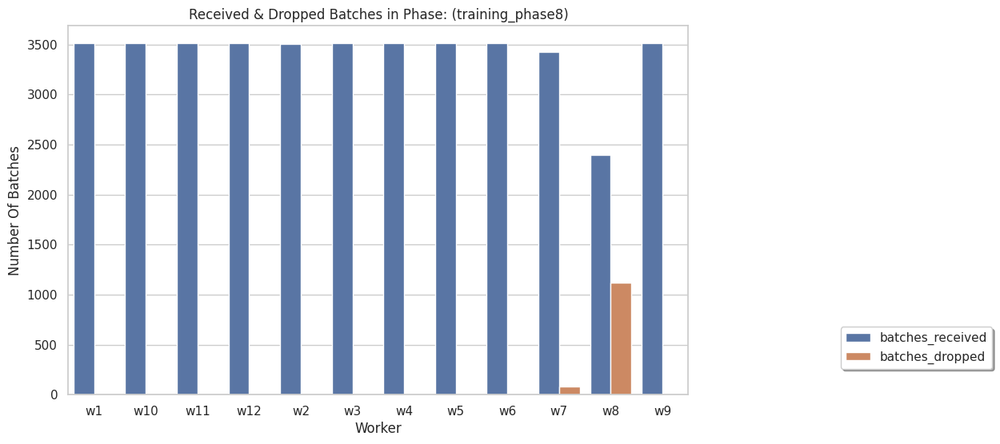

In [40]:
recieved_train = stats_train8.get_recieved_batches()
missed_train = stats_train8.get_missed_batches()
stats_train8.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_batches_train_8.json"
file_path = os.path.join(folder_path, file_name)

# Ensure the folder exists
os.makedirs(folder_path, exist_ok=True)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_train, json_file)

file_name = "missed_batches_train_8.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_train, json_file)

# <span style="color:red;"> *Score Discretization*: </span> Classes are discretized into 3 slots: 1-3, 4-6, 7-9

## Predictaion phase 1:

In [41]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 13:31:04,250] Experiment phase: prediction_phase1 of type prediction starts running...
[INFO][2024-08-14 13:31:04,251] Sending data to sources
[INFO][2024-08-14 13:31:14,785] Data is ready in sources
[INFO][2024-08-14 13:31:14,786] Phase prediction requested from Main Server
[INFO][2024-08-14 13:32:16,495] Processing experiment phase data
[INFO][2024-08-14 13:32:16,518] Processing experiment phase data completed
[INFO][2024-08-14 13:32:16,519] Start generating communication statistics for prediction_phase1 of type prediction
[INFO][2024-08-14 13:32:16,520] Statistics requested from Main Server
[INFO][2024-08-14 13:32:16,573] Statistics received from Main Server
[INFO][2024-08-14 13:32:16,574] Phase of prediction_phase1 prediction completed


In [42]:
stats_pred1 = API.get_experiment_flow(exp_name).generate_stats()

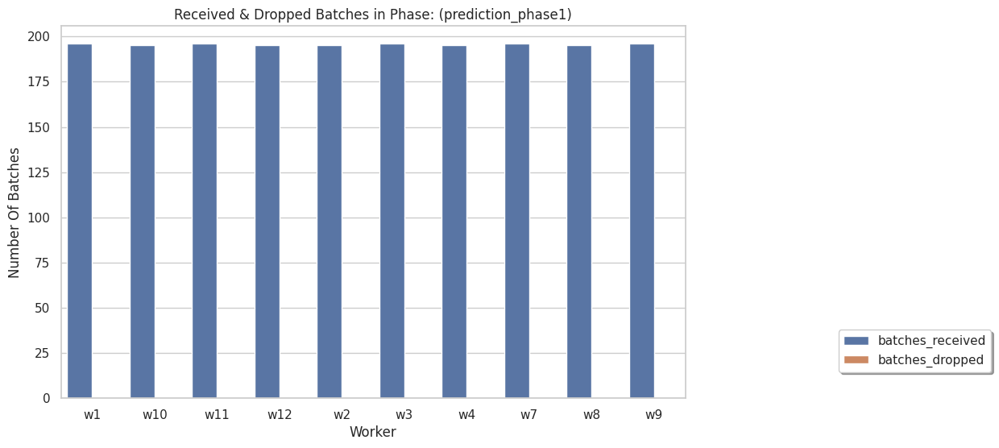

In [43]:
recieved_predict = stats_pred1.get_recieved_batches()
missed_predict = stats_pred1.get_missed_batches()
stats_pred1.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_predict_1.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_predict, json_file)

file_name = "missed_predict_1.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_predict, json_file)

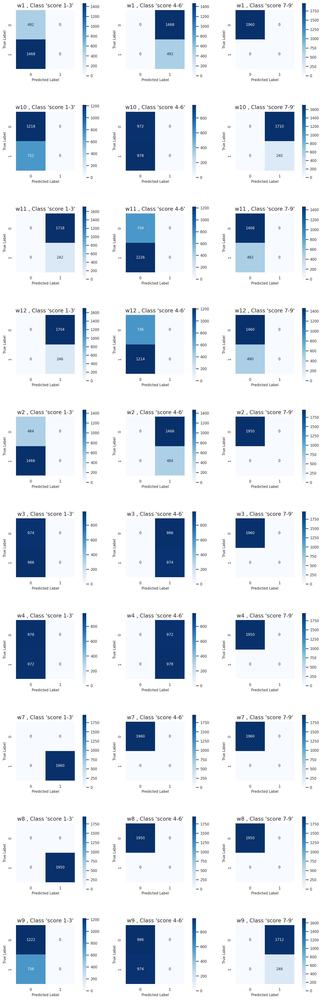

In [44]:
source_conf1 , conf_mats1 = stats_pred1.get_confusion_matrices_eeg(plot=True)

In [ ]:
file_name = "conf_mats1.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_mats1, json_file)

file_name = "conf_source1.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_source1, json_file)

In [45]:
model_performence1 = stats_pred1.get_model_performence_stats(conf_mats1)

,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w2,1,484,0,1466,0,0.248205,0.5,0.000000,0.0,1.0,0.0,0.000000
1,w2,2,0,1466,0,484,0.248205,0.5,0.248205,1.0,0.0,0.0,0.397699
2,w2,3,1950,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
3,w1,1,492,0,1468,0,0.251020,0.5,0.000000,0.0,1.0,0.0,0.000000
4,w1,2,0,1468,0,492,0.251020,0.5,0.251020,1.0,0.0,0.0,0.401305
5,w1,3,1960,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
6,w4,1,978,0,972,0,0.501538,0.5,0.000000,0.0,1.0,0.0,0.000000
7,w4,2,0,972,0,978,0.501538,0.5,0.501538,1.0,0.0,0.0,0.668033
8,w4,3,1950,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
9,w3,1,974,0,986,0,0.496939,0.5,0.000000,0.0,1.0,0.0,0.000000


In [ ]:
filename = f'predict_performence1.csv'
filepath = os.path.join(directory, filename)
model_performence1.to_csv(filepath)

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence1.sort_values('Worker') , x='Worker' , y='F1',hue='Class')
plt.title("Worker - F1 Score")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence1.sort_values('Worker') , x='Worker' , y='Accuracy',hue='Class')
plt.title("Worker - Accuracy")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence1.sort_values('Worker') , x='Worker' , y='Precision',hue='Class')
plt.title("Worker - Precision")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence1.sort_values('Worker') , x='Worker' , y='Recall',hue='Class')
plt.title("Worker - Recall")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()

## Predictaion phase 2:

In [46]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 13:32:49,979] Experiment phase: prediction_phase2 of type prediction starts running...
[INFO][2024-08-14 13:32:49,980] Sending data to sources
[INFO][2024-08-14 13:33:02,442] Data is ready in sources
[INFO][2024-08-14 13:33:02,443] Phase prediction requested from Main Server
[INFO][2024-08-14 13:34:04,285] Processing experiment phase data
[INFO][2024-08-14 13:34:04,318] Processing experiment phase data completed
[INFO][2024-08-14 13:34:04,319] Start generating communication statistics for prediction_phase2 of type prediction
[INFO][2024-08-14 13:34:04,319] Statistics requested from Main Server
[INFO][2024-08-14 13:34:04,372] Statistics received from Main Server
[INFO][2024-08-14 13:34:04,373] Phase of prediction_phase2 prediction completed


In [47]:
stats_pred2 = API.get_experiment_flow(exp_name).generate_stats()

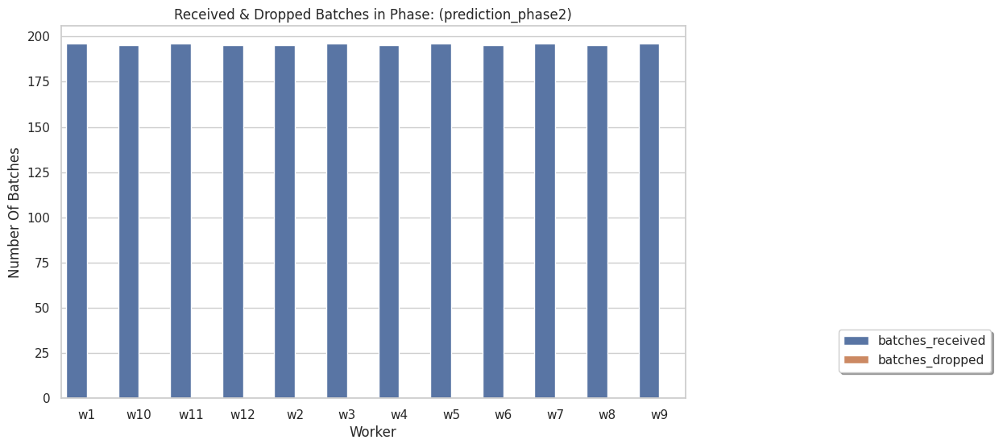

In [48]:
recieved_predict = stats_pred2.get_recieved_batches()
missed_predict = stats_pred2.get_missed_batches()
stats_pred2.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_predict_2.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_predict, json_file)

file_name = "missed_predict_2.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_predict, json_file)

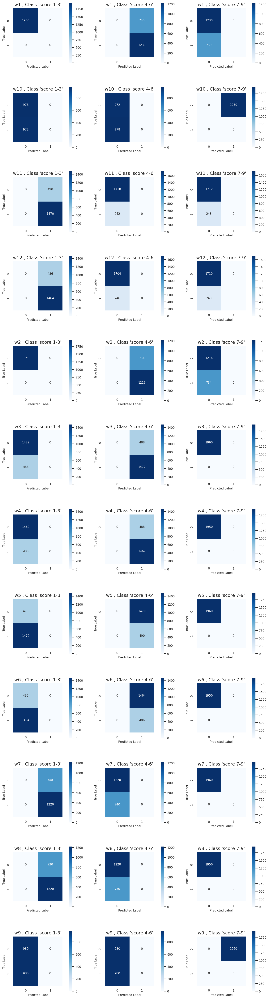

In [49]:
source_conf2 , conf_mats2 = stats_pred2.get_confusion_matrices_eeg(plot=True)

In [ ]:
file_name = "conf_mats2.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_mats2, json_file)

file_name = "conf_source2.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_source2, json_file)

In [50]:
model_performence2 = stats_pred2.get_model_performence_stats(conf_mats2)

,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w1,1,1960,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
1,w1,2,0,730,0,1230,0.627551,0.5,0.627551,1.0,0.0,0.0,0.771160
2,w1,3,1230,0,730,0,0.627551,0.5,0.000000,0.0,1.0,0.0,0.000000
3,w2,1,1950,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
4,w2,2,0,734,0,1216,0.623590,0.5,0.623590,1.0,0.0,0.0,0.768162
5,w2,3,1216,0,734,0,0.623590,0.5,0.000000,0.0,1.0,0.0,0.000000
6,w3,1,1472,0,488,0,0.751020,0.5,0.000000,0.0,1.0,0.0,0.000000
7,w3,2,0,488,0,1472,0.751020,0.5,0.751020,1.0,0.0,0.0,0.857809
8,w3,3,1960,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
9,w4,1,1462,0,488,0,0.749744,0.5,0.000000,0.0,1.0,0.0,0.000000


In [ ]:
filename = f'predict_performence2.csv'
filepath = os.path.join(directory, filename)
model_performence2.to_csv(filepath)

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance2.sort_values('Worker') , x='Worker' , y='F1',hue='Class')
plt.title("Worker - F1 Score")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance2.sort_values('Worker') , x='Worker' , y='Accuracy',hue='Class')
plt.title("Worker - Accuracy")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance2.sort_values('Worker') , x='Worker' , y='Precision',hue='Class')
plt.title("Worker - Precision")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence2.sort_values('Worker') , x='Worker' , y='Recall',hue='Class')
plt.title("Worker - Recall")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()

## Predictaion phase 3:

In [51]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 13:34:52,340] Experiment phase: prediction_phase3 of type prediction starts running...
[INFO][2024-08-14 13:34:52,341] Sending data to sources
[INFO][2024-08-14 13:35:05,959] Data is ready in sources
[INFO][2024-08-14 13:35:05,960] Phase prediction requested from Main Server
[INFO][2024-08-14 13:36:07,915] Processing experiment phase data
[INFO][2024-08-14 13:36:07,952] Processing experiment phase data completed
[INFO][2024-08-14 13:36:07,953] Start generating communication statistics for prediction_phase3 of type prediction
[INFO][2024-08-14 13:36:07,953] Statistics requested from Main Server
[INFO][2024-08-14 13:36:08,006] Statistics received from Main Server
[INFO][2024-08-14 13:36:08,007] Phase of prediction_phase3 prediction completed


In [52]:
stats_pred3 = API.get_experiment_flow(exp_name).generate_stats()

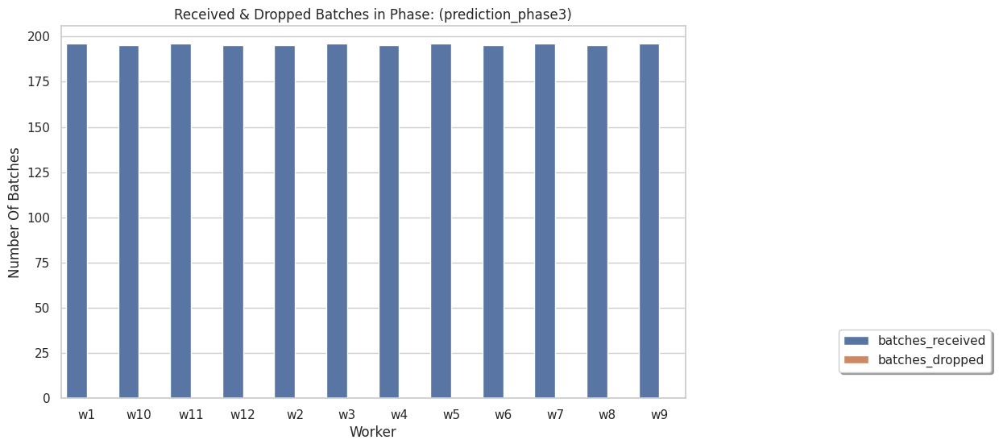

In [53]:
recieved_predict = stats_pred3.get_recieved_batches()
missed_predict = stats_pred3.get_missed_batches()
stats_pred3.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_predict_3.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_predict, json_file)

file_name = "missed_predict_3json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_predict, json_file)


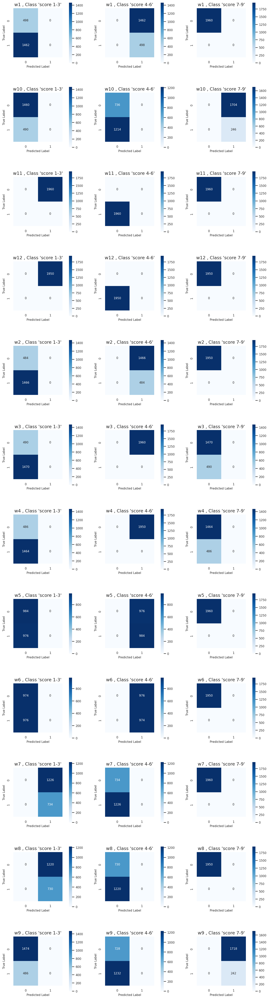

In [54]:
source_conf3, conf_mats3 = stats_pred3.get_confusion_matrices_eeg(plot=True)

In [ ]:
file_name = "conf_mats3.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_mats3, json_file)

file_name = "conf_source3.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_source3, json_file)

In [55]:
model_performence3 = stats_pred3.get_model_performence_stats(conf_mats3)

,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w1,1,498,0,1462,0,0.254082,0.5,0.000000,0.0,1.0,0.0,0.000000
1,w1,2,0,1462,0,498,0.254082,0.5,0.254082,1.0,0.0,0.0,0.405207
2,w1,3,1960,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
3,w2,1,484,0,1466,0,0.248205,0.5,0.000000,0.0,1.0,0.0,0.000000
4,w2,2,0,1466,0,484,0.248205,0.5,0.248205,1.0,0.0,0.0,0.397699
5,w2,3,1950,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
6,w4,1,486,0,1464,0,0.249231,0.5,0.000000,0.0,1.0,0.0,0.000000
7,w4,2,0,1950,0,0,0.000000,0.0,0.000000,0.0,0.0,-1.0,0.000000
8,w4,3,1464,0,486,0,0.750769,0.5,0.000000,0.0,1.0,0.0,0.000000
9,w3,1,490,0,1470,0,0.250000,0.5,0.000000,0.0,1.0,0.0,0.000000


In [ ]:
filename = f'predict_performence3.csv'
filepath = os.path.join(directory, filename)
model_performence3.to_csv(filepath)

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance3.sort_values('Worker') , x='Worker' , y='F1',hue='Class')
plt.title("Worker - F1 Score")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance3.sort_values('Worker') , x='Worker' , y='Accuracy',hue='Class')
plt.title("Worker - Accuracy")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance3.sort_values('Worker') , x='Worker' , y='Precision',hue='Class')
plt.title("Worker - Precision")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence3.sort_values('Worker') , x='Worker' , y='Recall',hue='Class')
plt.title("Worker - Recall")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()

## Predictaion phase 4:

In [56]:
API.next_experiment_phase()
API.run_current_experiment_phase()

[INFO][2024-08-14 13:36:58,024] Experiment phase: prediction_phase4 of type prediction starts running...
[INFO][2024-08-14 13:36:58,025] Sending data to sources
[INFO][2024-08-14 13:37:14,323] Data is ready in sources
[INFO][2024-08-14 13:37:14,324] Phase prediction requested from Main Server
[INFO][2024-08-14 13:38:16,132] Processing experiment phase data
[INFO][2024-08-14 13:38:16,166] Processing experiment phase data completed
[INFO][2024-08-14 13:38:16,167] Start generating communication statistics for prediction_phase4 of type prediction
[INFO][2024-08-14 13:38:16,168] Statistics requested from Main Server
[INFO][2024-08-14 13:38:16,221] Statistics received from Main Server
[INFO][2024-08-14 13:38:16,222] Phase of prediction_phase4 prediction completed


In [57]:
stats_pred4 = API.get_experiment_flow(exp_name).generate_stats()

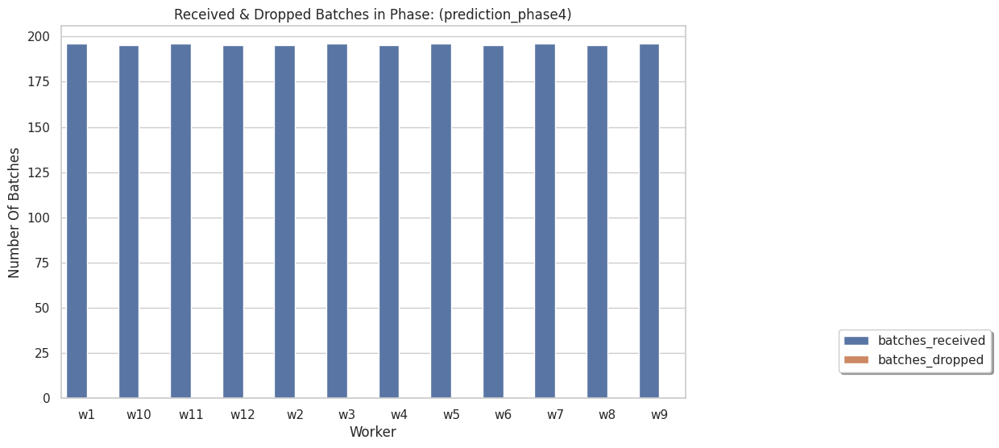

In [58]:
recieved_predict = stats_pred4.get_recieved_batches()
missed_predict = stats_pred4.get_missed_batches()
stats_pred4.plot_batches_status(plot=True)

In [ ]:
file_name = "recieved_predict_4.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(recieved_predict, json_file)

file_name = "missed_predict_4.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(missed_predict, json_file)


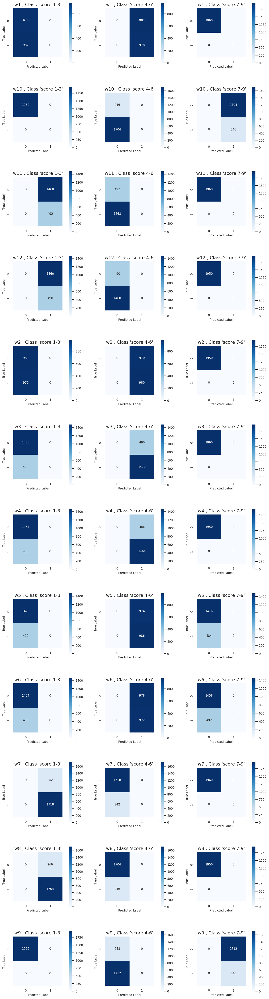

In [59]:
source_conf4 , conf_mats4 = stats_pred4.get_confusion_matrices_eeg(plot=True)

In [ ]:
file_name = "conf_mats4.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_mats4, json_file)

file_name = "conf_source4.json"
file_path = os.path.join(folder_path, file_name)

# Save the dictionary as a JSON file in the specified folder
with open(file_path, "w") as json_file:
    json.dump(conf_source4, json_file)

In [60]:
model_performence4 = stats_pred4.get_model_performence_stats(conf_mats4)

,Worker,Class,TN,FP,FN,TP,Accuracy,Balanced Accuracy,Precision,Recall,True Negative Rate,Informedness,F1
0,w1,1,978,0,982,0,0.498980,0.5,0.000000,0.0,1.0,0.0,0.000000
1,w1,2,0,982,0,978,0.498980,0.5,0.498980,1.0,0.0,0.0,0.665759
2,w1,3,1960,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
3,w2,1,980,0,970,0,0.502564,0.5,0.000000,0.0,1.0,0.0,0.000000
4,w2,2,0,970,0,980,0.502564,0.5,0.502564,1.0,0.0,0.0,0.668942
5,w2,3,1950,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
6,w4,1,1464,0,486,0,0.750769,0.5,0.000000,0.0,1.0,0.0,0.000000
7,w4,2,0,486,0,1464,0.750769,0.5,0.750769,1.0,0.0,0.0,0.857645
8,w4,3,1950,0,0,0,1.000000,0.5,0.000000,0.0,1.0,0.0,0.000000
9,w3,1,1470,0,490,0,0.750000,0.5,0.000000,0.0,1.0,0.0,0.000000


In [ ]:
filename = f'predict_performence4.csv'
filepath = os.path.join(directory, filename)
model_performence4.to_csv(filepath)

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance4.sort_values('Worker') , x='Worker' , y='F1',hue='Class')
plt.title("Worker - F1 Score")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance4.sort_values('Worker') , x='Worker' , y='Accuracy',hue='Class')
plt.title("Worker - Accuracy")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_preformance4.sort_values('Worker') , x='Worker' , y='Precision',hue='Class')
plt.title("Worker - Precision")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()
plt.figure(figsize=(12,5))
sns.barplot(data=model_performence4.sort_values('Worker') , x='Worker' , y='Recall',hue='Class')
plt.title("Worker - Recall")
plt.legend(title='Class', bbox_to_anchor=(1.15, 1), loc='upper right') 
plt.show()